<a href="https://colab.research.google.com/github/bedhinesh/capstone-aiml/blob/subrahmanya/YOLO_Capstone_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
project_path = r'/content/drive/MyDrive/CapstoneProject/Data/'

In [3]:
import pandas as pd
import numpy as np
import csv
DATASET_FOLDER_TRAIN = project_path +"car_data/car_data/train/"
DATASET_FOLDER_TEST = "car_data/car_data/test/"
TRAIN_CSV = project_path + "anno_train.csv"
TEST_CSV = project_path + "anno_test.csv"
DATA_LABELS = np.array(pd.read_csv(project_path+'names.csv',\
                                   header = None))

In [4]:
import numpy as np
import csv

with open(TRAIN_CSV, "r") as f:
  
  y_train = np.zeros((sum(1 for line in f), 5))
  X_train = []
  z_train = []
  f.seek(0)
  data = csv.reader(f, delimiter=',')
  for index, row in enumerate(data):
    for i, r in enumerate(row[1:7]):
      row[i+1] = int(r)
    path, x0, y0, x1, y1, car_ref = row       # Read image, its dimensions, BBox coords
    path = DATASET_FOLDER_TRAIN + DATA_LABELS[car_ref-1][0] + '/'+path
    #y_train[index, 0] = x0 * IMAGE_SIZE / image_width                 # Normalize bounding box by image size
    #y_train[index, 1] = y0 * IMAGE_SIZE / image_height                # Normalize bounding box by image size
    #y_train[index, 2] = (x1 - x0) * IMAGE_SIZE / image_width          # Normalize bounding box by image size
    #y_train[index, 3] = (y1 - y0) * IMAGE_SIZE / image_height         # Normalize bounding box by image size
    y_train[index, 0] = x0               # Normalize bounding box by image size
    y_train[index, 1] = y0              # Normalize bounding box by image size
    y_train[index, 2] = (x1 - x0)          # Normalize bounding box by image size
    y_train[index, 3] = (y1 - y0)       # Normalize bounding box by image size
    y_train[index, 4] = int(car_ref)
    X_train.append(path)                 

In [5]:
X_train[:5]

['/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Audi TTS Coupe 2012/00001.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Acura TL Sedan 2012/00002.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Dodge Dakota Club Cab 2007/00003.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Hyundai Sonata Hybrid Sedan 2012/00004.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Ford F-450 Super Duty Crew Cab 2012/00005.jpg']

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Cadillac CTS-V Sedan 2012/00098.jpg


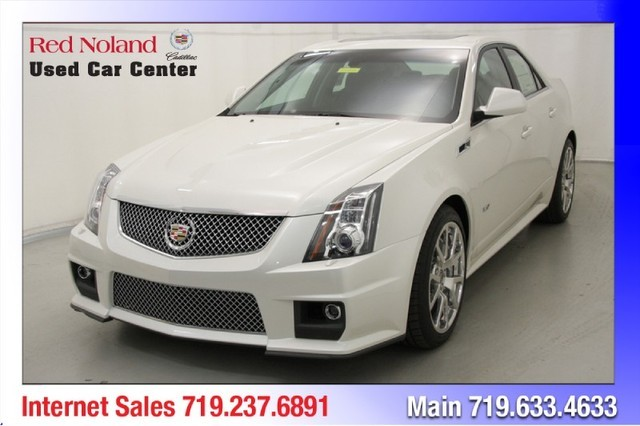

In [6]:
import cv2
from google.colab.patches import cv2_imshow
# Pick a random image to check how it looks
filename = X_train[97]
print(filename)
unscaled = cv2.imread(filename)

cv2_imshow(unscaled) 

region = y_train[97]
x0 = region[0]
y0 = region[1]

x1 = (region[0] + region[2])
y1 = (region[1] + region[3])

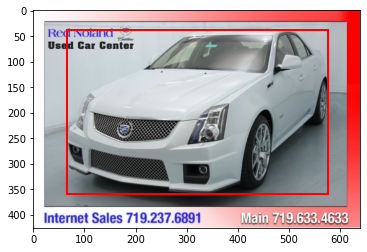

In [7]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Dodge Dakota Club Cab 2007/00003.jpg


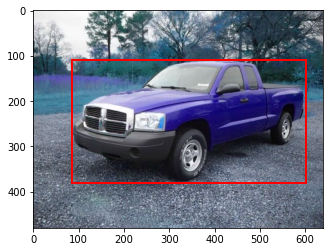

In [8]:
# Pick a random image to check how it looks
filename = X_train[2]
print(filename)
unscaled = cv2.imread(filename)

region = y_train[2]
x0 = region[0]
y0 = region[1]

x1 = (region[0] + region[2])
y1 = (region[1] + region[3])

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Audi RS 4 Convertible 2008/00201.jpg


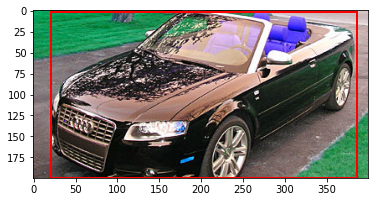

In [9]:
# Pick a random image to check how it looks
filename = X_train[200]
print(filename)
unscaled = cv2.imread(filename)
region = y_train[200]
x0 = region[0]
y0 = region[1]

x1 = (region[0] + region[2])
y1 = (region[1] + region[3])

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
imag_ab = ax.add_patch(rect)
imag_ab
plt.show()

In [38]:
print(X_train[2])

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Dodge Dakota Club Cab 2007/00003.jpg


In [39]:
print(y_train[2])
print(DATA_LABELS[int(y_train[2][4])-1][0])

[ 85. 109. 516. 272.  91.]
Dodge Dakota Club Cab 2007


Exploratory Data Analysis - Train Data


In [ ]:
df_train=pd.read_csv(TRAIN_CSV, header=None)

df_train.columns =['Image', 'x0', 'y0', 'x1', 'y1','Car_ref'] 
df_test=pd.read_csv(TEST_CSV, header=None)
df_test.columns =['Image', 'x0', 'y0', 'x1', 'y1','Car_ref'] 

In [ ]:
df_train.shape

(8144, 6)

In [ ]:
df_test.shape


(8041, 6)

In [ ]:
df_train.head()


,Image,x0,y0,x1,y1,Car_ref
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Image    8144 non-null   object
 1   x0       8144 non-null   int64 
 2   y0       8144 non-null   int64 
 3   x1       8144 non-null   int64 
 4   y1       8144 non-null   int64 
 5   Car_ref  8144 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 381.9+ KB


In [ ]:
## Some names contain '/' like 155 record in train data as the file location has - instead of /
## We will have to replace this with '-' since the folder location in data has '-'
# adding car name to train
df_train["Car_name"] = ''
df_test["Car_name"] = ''
i=0
for ref in df_train["Car_ref"]:
  ref=DATA_LABELS[ref-1][0]
  df_train["Car_name"][i] = ref.replace("/" ,"-")## We will have to replace this with '-' since the folder location in data has '-'
  i=i+1
# adding car name to test
i=0
for ref in df_test["Car_ref"]:
  ref=DATA_LABELS[ref-1][0]
  df_test["Car_name"][i] = ref.replace("/" ,"-")## We will have to replace this with '-' since the folder location in data has '-'
  i=i+1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


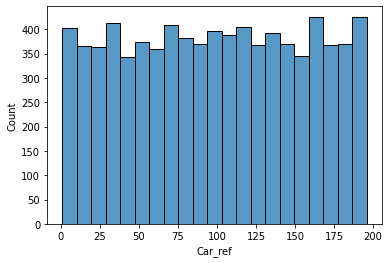

In [ ]:
#test data split
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.histplot(df_test['Car_ref'])
print()

In [ ]:
df_train.Car_name.value_counts()

GMC Savana Van 2012                                    68
Chrysler 300 SRT-8 2010                                49
Mitsubishi Lancer Sedan 2012                           48
Mercedes-Benz 300-Class Convertible 1993               48
Jaguar XK XKR 2012                                     47
                                                       ..
Rolls-Royce Phantom Drophead Coupe Convertible 2012    31
Chevrolet Express Cargo Van 2007                       30
Maybach Landaulet Convertible 2012                     29
FIAT 500 Abarth 2012                                   28
Hyundai Accent Sedan 2012                              24
Name: Car_name, Length: 196, dtype: int64

In [ ]:
df_test.Car_name.value_counts()

GMC Savana Van 2012                                    68
Mercedes-Benz 300-Class Convertible 1993               48
Chrysler 300 SRT-8 2010                                48
Mitsubishi Lancer Sedan 2012                           47
Jaguar XK XKR 2012                                     46
                                                       ..
Rolls-Royce Phantom Drophead Coupe Convertible 2012    30
Maybach Landaulet Convertible 2012                     29
Chevrolet Express Cargo Van 2007                       29
FIAT 500 Abarth 2012                                   27
Hyundai Accent Sedan 2012                              24
Name: Car_name, Length: 196, dtype: int64

In [ ]:
# Adding file location to the Train df
#df_train['File_loc']='/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/'+df_train['Car_name']+'/'+df_train['Image']
#df_train.head()

In [ ]:
# Adding file location to the test df
#df_test['File_loc']='/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/test/'+df_test['Car_name']+'/'+df_test['Image']
#df_test.head()


In [ ]:
# Adding Car_type and Year to the train and test data set
# train
"""df_train["Car_type"] = ''
df_train["Year"] = ''
i=0
for ref in df_train["Car_name"]:
  words = ref.split()
  df_train["Car_type"][i] = words[-2]
  df_train["Year"][i] = words[-1]
  i=i+1
# test
df_test["Car_type"] = ''
df_test["Year"] = ''
i=0
for ref in df_test["Car_name"]:
  words = ref.split()
  df_test["Car_type"][i] = words[-2]
  df_test["Year"][i] = words[-1]
  i=i+1"""



In [ ]:
# Adding height and width to the train data set
"""df_train["Height"] = ''
df_train["Width"] = ''
i=0
for ref in df_train["File_loc"]:
  image = cv2.imread(ref)
  df_train["Height"][i] = image.shape[0]
  df_train["Width"][i] = image.shape[1]
  i=i+1

In [ ]:
# Adding height and width to the test data set
"""df_test["Height"] = ''
df_test["Width"] = ''
i=0
for ref in df_test["File_loc"]:
  image = cv2.imread(ref)
  df_test["Height"][i] = image.shape[0]
  df_test["Width"][i] = image.shape[1]
  i=i+1

In [ ]:
# saving the dataframe 
#df_train.to_csv('/content/drive/MyDrive/CapstoneProject/Data/df_train.csv') 

In [ ]:
# saving the dataframe 
#df_test.to_csv('/content/drive/MyDrive/CapstoneProject/Data/df_train.csv')

In [40]:
df_train=pd.read_csv('/content/drive/MyDrive/CapstoneProject/Data/df_train.csv')

In [41]:
df_train.head()

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900
2,2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2007,480,640
3,3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,1386,2100
4,4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2012,108,144


In [42]:
df_test=pd.read_csv('/content/drive/MyDrive/CapstoneProject/Data/df_test.csv')

In [43]:
df_test.head()

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,30,52,246,147,181,Suzuki Aerio Sedan 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2007,182,276
1,1,00002.jpg,100,19,576,203,103,Ferrari 458 Italia Convertible 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Convertible,2012,360,640
2,2,00003.jpg,51,105,968,659,145,Jeep Patriot SUV 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,SUV,2012,741,1024
3,3,00004.jpg,67,84,581,407,187,Toyota Camry Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,480,640
4,4,00005.jpg,140,151,593,339,185,Tesla Model S Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,373,600


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


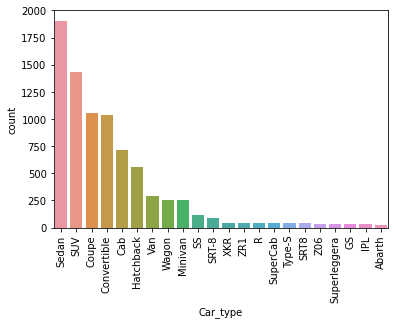

In [ ]:
#train data count cartype
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_train['Car_type'],order=df_train['Car_type'].value_counts().index)
plt.xticks(rotation=90)
print()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


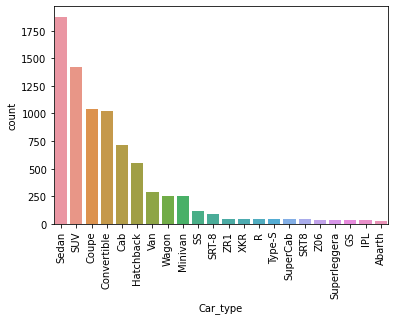

In [ ]:
#test data count cartype
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_test['Car_type'],order=df_test['Car_type'].value_counts().index)
plt.xticks(rotation=90)
print()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


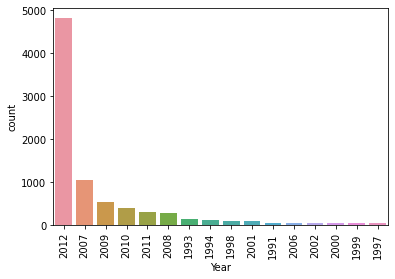

In [ ]:
#train data count year wise
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_train['Year'],order=df_train['Year'].value_counts().index)
plt.xticks(rotation=90)
print()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


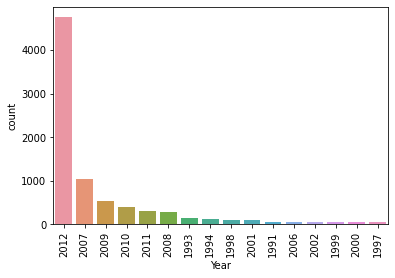

In [ ]:
#train data count year wise
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_test['Year'],order=df_test['Year'].value_counts().index)
plt.xticks(rotation=90)
print()

In [ ]:
df_train.head(2)

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900


In [ ]:
import imgaug as ia

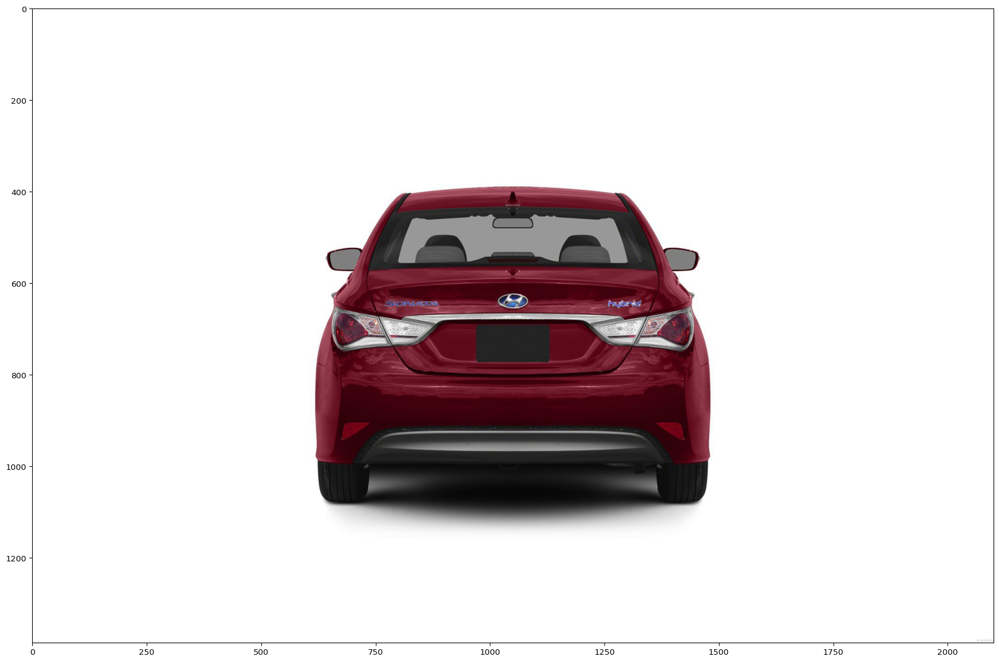

In [ ]:
import imageio
image1 = imageio.imread(df_train.iloc[3][8])
ia.imshow(image1)

In [ ]:
(df_train.iloc[3][7])

'Hyundai Sonata Hybrid Sedan 2012'

In [ ]:
import imgaug.augmenters as iaa

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [ ]:
num = 0
for image2 in images_aug:
    cv2.imwrite(str(num)+ ".jpg",image2)
    num += 1

In [ ]:
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
bbs = BoundingBoxesOnImage([BoundingBox(x1=df_train.iloc[3][2], x2=df_train.iloc[3][4],y1=df_train.iloc[3][3],y2=df_train.iloc[3][5])],shape=image1.shape)

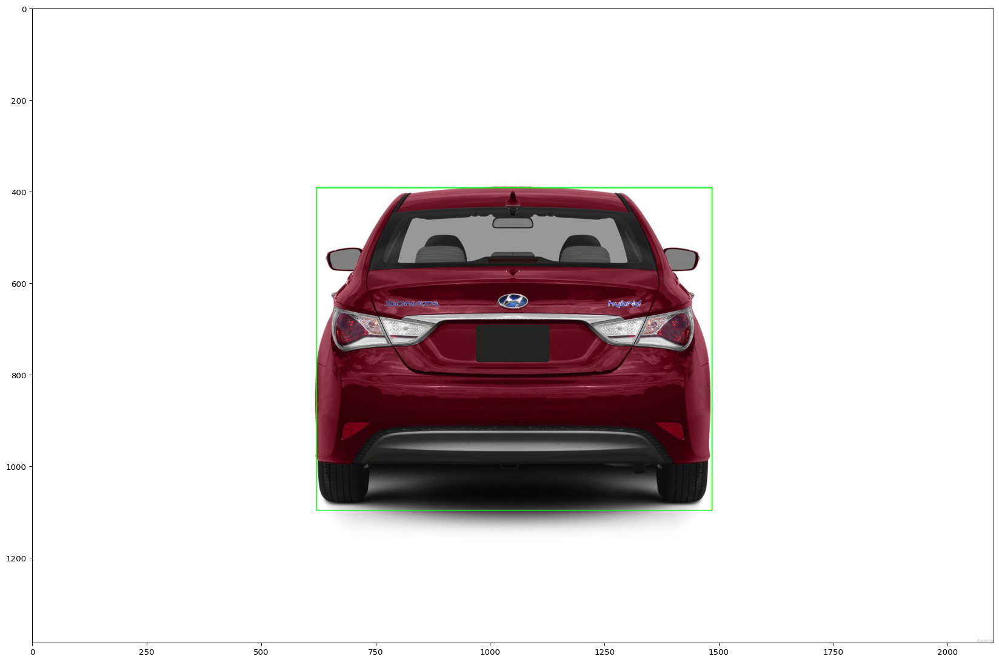

In [ ]:
ia.imshow(bbs.draw_on_image(image1,size=2))

In [ ]:
seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True)

# Augment BBs and images.
new_images[]
for i in range(4):
    image_aug,bbs_aug = seq(image=image1,bounding_boxes=bbs)
    new_images.append([image_aug,bbs_aug,image1])


# print coordinates before/after augmentation (see below)
# use .x1_int, .y_int, ... to get integer coordinates
for i in range(len(bbs.bounding_boxes)):
    before = bbs.bounding_boxes[i]
    after = bbs_aug.bounding_boxes[i]
    print("BB %d: (%.0f, %.0f, %.0f, %.0f) -> (%.0f, %.0f, %.0f, %.0f)" % (
        i,
        before.x1, before.y1, before.x2, before.y2,
        after.x1, after.y1, after.x2, after.y2)
    )

BB 0: (621, 393, 1484, 1096) -> (768, 210, 2134, 1230)


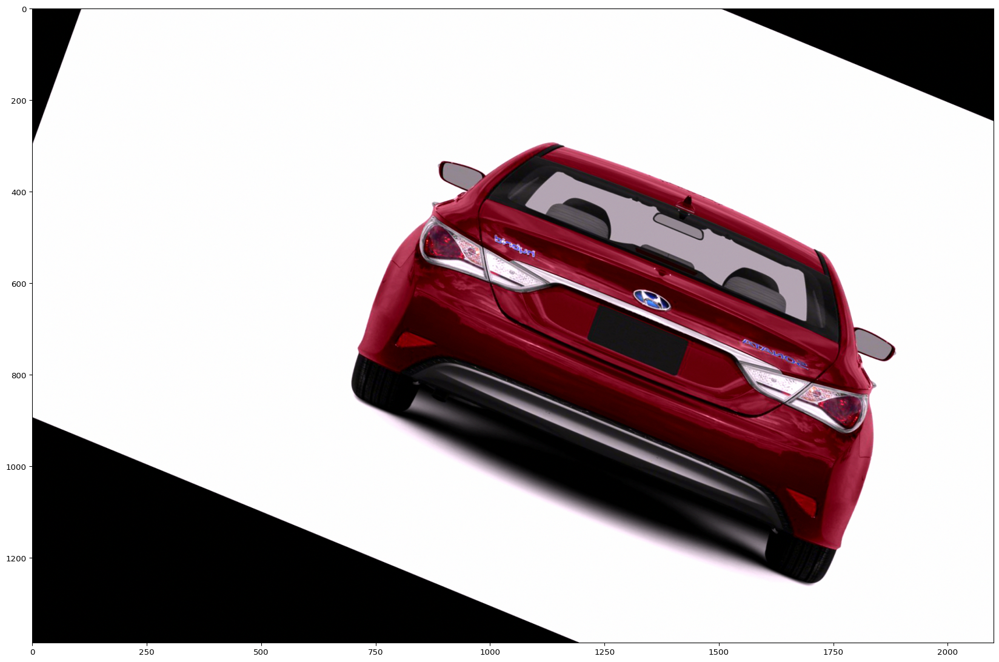

In [ ]:
ia.imshow(image_aug)

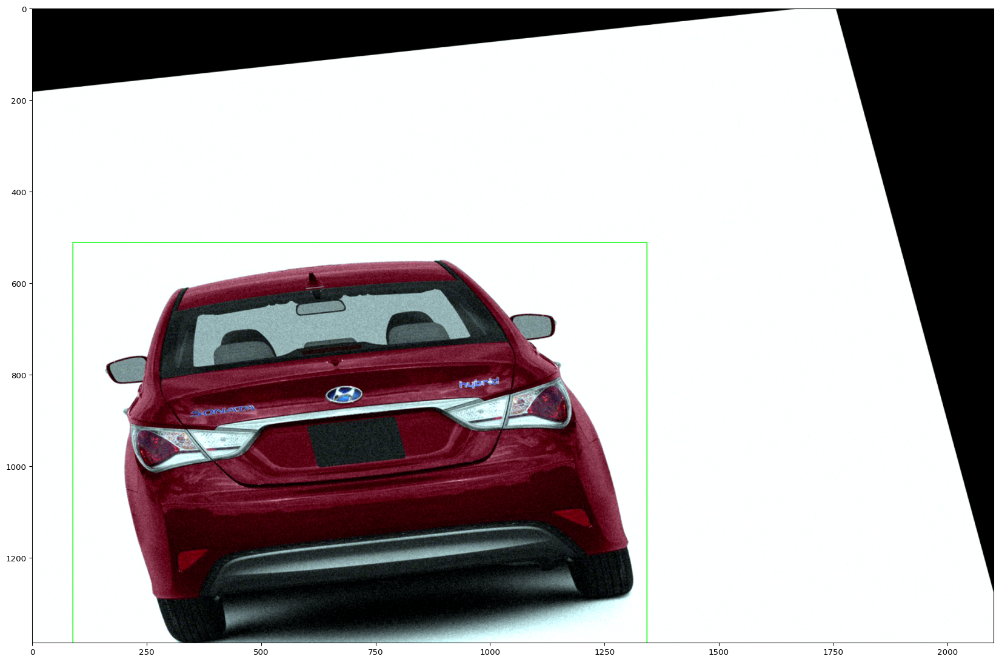

In [ ]:
ia.imshow(bbs_aug.draw_on_image(image_aug,size=2))

In [ ]:
def pad(image,by):
    image_border1 = ia.pad(image,top=1,right=1,bottom=1,left=1,
                           mode="constant",cval=255)
    image_border2 = ia.pad(image_border1,top=by-1,right=by-1,bottom=by-1,left=by-1,
                           mode="constant",cval=0)
    return image_border2


In [ ]:
def draw_bbs(image,bbs,border):
    GREEN = [0,255,0]
    ORANGE = [255,140,0]
    RED = [255,0,0]
    image_border = pad(image,border)
    for bb in bbs.bounding_boxes:
        if bb.is_fully_within_image(image.shape):
           colour = GREEN
        elif bb.is_partly_within_image(image.shape):
           colour = ORANGE
        else:
           colour = RED
        image_border = bb.shift(left=border,top =border)\
                      .draw_on_image(image_border,size=2,color=colour)
    return image_border

In [ ]:
image_after = draw_bbs(image_aug,bbs_aug.remove_out_of_image().clip_out_of_image(),100)

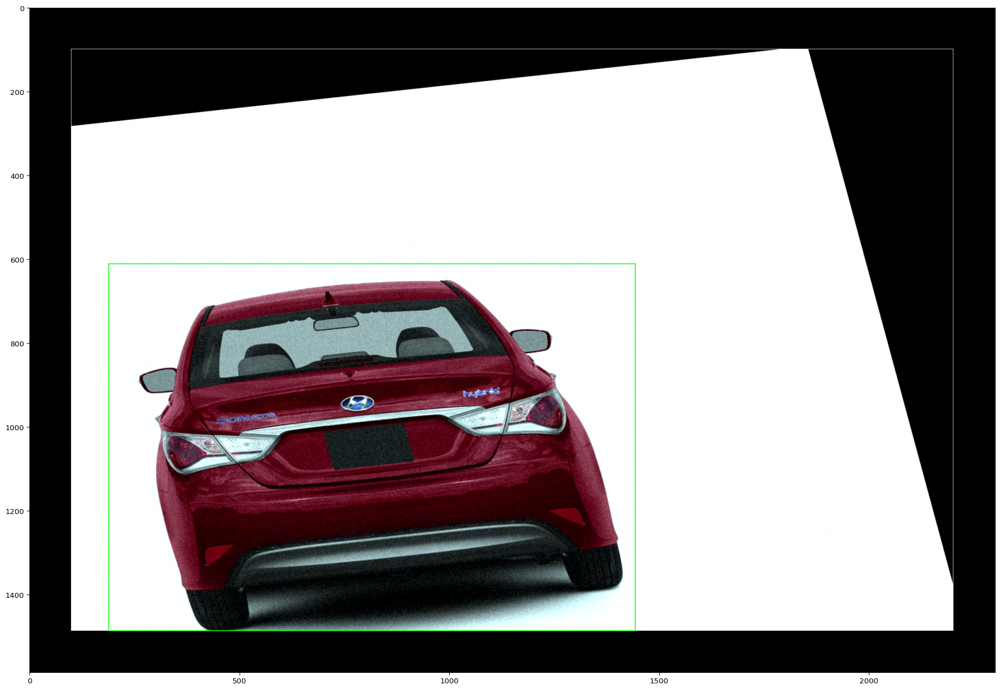

In [ ]:
ia.imshow(image_after)

In [ ]:
image_aug, bbs_aug = seq(image=image_after, bounding_boxes=bbs)

In [ ]:
for i in range(len(bbs.bounding_boxes)):
    before = bbs.bounding_boxes[i]
    after = bbs_aug.bounding_boxes[i]
    print("BB %d: (%.0f, %.0f, %.0f, %.0f) -> (%.0f, %.0f, %.0f, %.0f)" % (
        i,
        before.x1, before.y1, before.x2, before.y2,
        after.x1, after.y1, after.x2, after.y2)
    )

BB 0: (621, 393, 1484, 1096) -> (89, 512, 1342, 1409)


In [ ]:
imageio.imwrite(os.path.join(path, path + "%06d.jpg" % (i,)), image_aug)

In [ ]:
df_train.head(5)

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900
2,2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2007,480,640
3,3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,1386,2100
4,4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2012,108,144


In [ ]:
len(df_train)

8144

In [ ]:
path = ('/content/drive/MyDrive/CapstoneProject/Data/Augmented')
aug_bbs = [0,0,0,0]
i=0
num=8145
for i in range(10):
    image_name = df_train.iloc[i][8]
    image = imageio.imread(image_name)
    bbs = BoundingBoxesOnImage([BoundingBox(x1=df_train.iloc[i][2], x2=df_train.iloc[i][4],
                                                      y1=df_train.iloc[i][3],y2=df_train.iloc[i][5])],
                                          shape=image.shape)
    image_aug,bbs_aug = seq(image=image,bounding_boxes=bbs)
    image_after = draw_bbs(image_aug,bbs_aug.remove_out_of_image().clip_out_of_image(),100)
    file_name = df_train.iloc[i][1]
    imageio.imwrite(os.path.join(path, "%0d.jpg" %(num,)),image_after)
    num +=1

    

In [ ]:
path = ('/content/drive/MyDrive/CapstoneProject/Data/Augmented')
aug_bbs = [0,0,0,0]
i=0
num=8145
for i in range(10):
    image_name = df_train.iloc[i][8]
    image = imageio.imread(image_name)
    bbs = BoundingBoxesOnImage([BoundingBox(x1=df_train.iloc[i][2], x2=df_train.iloc[i][4],
                                                      y1=df_train.iloc[i][3],y2=df_train.iloc[i][5])],
                                          shape=image.shape)
    image_aug,bbs_aug = seq(image=image,bounding_boxes=bbs)
    bbs_aug.bounding_boxes
    image_after = draw_bbs(image_aug,bbs_aug.remove_out_of_image().clip_out_of_image(),100)
    file_name = df_train.iloc[i][1]
    imageio.imwrite(os.path.join(path, "%0d.jpg" %(num,)),image_after)
    num +=1

In [ ]:
def bbs_obj_to_df(bbs_aug_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_aug_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs_aug = pd.DataFrame(bbs_array, columns=['x0', 'y0', 'x1', 'y1'])
    return df_bbs_aug

In [ ]:
bbs_obj_to_df(bbs_aug)

,x0,y0,x1,y1
0,-125.513077,-109.240997,534.712585,392.143707


# YOLO V3

In [14]:
# create a YOLOv3 Keras model and save it to file
# based on https://github.com/experiencor/keras-yolo3
import struct
import numpy as np
from keras.layers import Conv2D
from keras.layers import Input
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from keras.layers import ZeroPadding2D
from keras.layers import UpSampling2D
from keras.layers.merge import add, concatenate
from keras.models import Model
 
def _conv_block(inp, convs, skip=True):
    x = inp
    count = 0
    for conv in convs:
        if count == (len(convs) - 2) and skip:
            skip_connection = x
        count += 1
        if conv['stride'] > 1: x = ZeroPadding2D(((1,0),(1,0)))(x) # peculiar padding as darknet prefer left and top
        x = Conv2D(conv['filter'],
                   conv['kernel'],
                   strides=conv['stride'],
                   padding='valid' if conv['stride'] > 1 else 'same', # peculiar padding as darknet prefer left and top
                   name='conv_' + str(conv['layer_idx']),
                   use_bias=False if conv['bnorm'] else True)(x)
        if conv['bnorm']: x = BatchNormalization(epsilon=0.001, name='bnorm_' + str(conv['layer_idx']))(x)
        if conv['leaky']: x = LeakyReLU(alpha=0.1, name='leaky_' + str(conv['layer_idx']))(x)
    return add([skip_connection, x]) if skip else x

def make_yolov3_model():
    input_image = Input(shape=(None, None, 3))
    # Layer  0 => 4
    x = _conv_block(input_image, [{'filter': 32, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 0},
                                  {'filter': 64, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 1},
                                  {'filter': 32, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 2},
                                  {'filter': 64, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 3}])
    # Layer  5 => 8
    x = _conv_block(x, [{'filter': 128, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 5},
                        {'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 6},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 7}])
    # Layer  9 => 11
    x = _conv_block(x, [{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 9},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 10}])
    # Layer 12 => 15
    x = _conv_block(x, [{'filter': 256, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 12},
                        {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 13},
                        {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 14}])
    # Layer 16 => 36
    for i in range(7):
        x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 16+i*3},
                            {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 17+i*3}])
    skip_36 = x
    # Layer 37 => 40
    x = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 37},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 38},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 39}])
    # Layer 41 => 61
    for i in range(7):
        x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 41+i*3},
                            {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 42+i*3}])
    skip_61 = x
    # Layer 62 => 65
    x = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 62},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 63},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 64}])
    # Layer 66 => 74
    for i in range(3):
        x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 66+i*3},
                            {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 67+i*3}])
    # Layer 75 => 79
    x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 75},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 76},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 77},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 78},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 79}], skip=False)
    # Layer 80 => 82
    yolo_82 = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 80},
                              {'filter':  255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 81}], skip=False)
    # Layer 83 => 86
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 84}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_61])
    # Layer 87 => 91
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 87},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 88},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 89},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 90},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 91}], skip=False)
    # Layer 92 => 94
    yolo_94 = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 92},
                              {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 93}], skip=False)
    # Layer 95 => 98
    x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True,   'layer_idx': 96}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_36])
    # Layer 99 => 106
    yolo_106 = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 99},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 100},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 101},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 102},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 103},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 104},
                               {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 105}], skip=False)
    model = Model(input_image, [yolo_82, yolo_94, yolo_106])
    return model

class WeightReader:
    def __init__(self, weight_file):
        with open(weight_file, 'rb') as w_f:
            major,	= struct.unpack('i', w_f.read(4))
            minor,	= struct.unpack('i', w_f.read(4))
            revision, = struct.unpack('i', w_f.read(4))
            if (major*10 + minor) >= 2 and major < 1000 and minor < 1000:
                w_f.read(8)
            else:
                w_f.read(4)
            transpose = (major > 1000) or (minor > 1000)
            binary = w_f.read()
        self.offset = 0
        self.all_weights = np.frombuffer(binary, dtype='float32')
 
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]

    def load_weights(self, model):
        for i in range(106):
            try:
                conv_layer = model.get_layer('conv_' + str(i))
                print("loading weights of convolution #" + str(i))
                if i not in [81, 93, 105]:
                    norm_layer = model.get_layer('bnorm_' + str(i))
                    size = np.prod(norm_layer.get_weights()[0].shape)
                    beta  = self.read_bytes(size) # bias
                    gamma = self.read_bytes(size) # scale
                    mean  = self.read_bytes(size) # mean
                    var   = self.read_bytes(size) # variance
                    weights = norm_layer.set_weights([gamma, beta, mean, var])
                if len(conv_layer.get_weights()) > 1:
                    bias   = self.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel, bias])
                else:
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel])
            except ValueError:
                print("no convolution #" + str(i))

    def reset(self):
        self.offset = 0

In [15]:
from matplotlib import pyplot
from matplotlib.patches import Rectangle
 
class BoundBox:
    def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        self.objness = objness
        self.classes = classes
        self.label = -1
        self.score = -1

    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)

        return self.label

    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]
 
        return self.score
 
def _sigmoid(x):
    return 1. / (1. + np.exp(-x))
 
def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
    grid_h, grid_w = netout.shape[:2]
    nb_box = 3
    netout = netout.reshape((grid_h, grid_w, nb_box, -1))
    nb_class = netout.shape[-1] - 5
    boxes = []
    netout[..., :2]  = _sigmoid(netout[..., :2])
    netout[..., 4:]  = _sigmoid(netout[..., 4:])
    netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
    netout[..., 5:] *= netout[..., 5:] > obj_thresh
 
    for i in range(grid_h*grid_w):
        row = i / grid_w
        col = i % grid_w
        for b in range(nb_box):
            # 4th element is objectness score
            objectness = netout[int(row)][int(col)][b][4]
            if(objectness.all() <= obj_thresh): continue
            # first 4 elements are x, y, w, and h
            x, y, w, h = netout[int(row)][int(col)][b][:4]
            x = (col + x) / grid_w # center position, unit: image width
            y = (row + y) / grid_h # center position, unit: image height
            w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
            h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height
            # last elements are class probabilities
            classes = netout[int(row)][col][b][5:]
            box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
            boxes.append(box)
    return boxes
 
def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
    new_w, new_h = net_w, net_h
    for i in range(len(boxes)):
        x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
        y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
        boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
        boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
        boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
        boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

def _interval_overlap(interval_a, interval_b):
    x1, x2 = interval_a
    x3, x4 = interval_b
    if x3 < x1:
        if x4 < x1:
            return 0
        else:
            return min(x2,x4) - x1
    else:
        if x2 < x3:
            return 0
        else:
            return min(x2,x4) - x3

def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
    intersect = intersect_w * intersect_h
    w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
    w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
    union = w1*h1 + w2*h2 - intersect
    return float(intersect) / union
 
def do_nms(boxes, nms_thresh):
    if len(boxes) > 0:
        nb_class = len(boxes[0].classes)
    else:
        return
    for c in range(nb_class):
        sorted_indices = np.argsort([-box.classes[c] for box in boxes])
        for i in range(len(sorted_indices)):
            index_i = sorted_indices[i]
            if boxes[index_i].classes[c] == 0: continue
            for j in range(i+1, len(sorted_indices)):
                index_j = sorted_indices[j]
                if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
                    boxes[index_j].classes[c] = 0

# load and prepare an image
def load_image_pixels(filename, shape):
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size
    # load the image with the required size
    image = load_img(filename, target_size=shape)
    # convert to numpy array
    image = img_to_array(image)
    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0
    # add a dimension so that we have one sample
    image = expand_dims(image, 0)
    return image, width, height
 
# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
    v_boxes, v_labels, v_scores = list(), list(), list()
    # enumerate all boxes
    for box in boxes:
        # enumerate all possible labels
        for i in range(len(labels)):
            # check if the threshold for this label is high enough
            if box.classes[i] > thresh:
                v_boxes.append(box)
                v_labels.append(labels[i])
                v_scores.append(box.classes[i]*100)
                # don't break, many labels may trigger for one box
    return v_boxes, v_labels, v_scores
 
# draw all results
def draw_boxes(filename, v_boxes, v_labels, v_scores):
    # load the image
    data = pyplot.imread(filename)
    # plot the image
    pyplot.imshow(data)
    # get the context for drawing boxes
    ax = pyplot.gca()
    # plot each box
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        # get coordinates
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        pyplot.text(x1, y1, label, color='white')
    # show the plot
    pyplot.show()

In [18]:
# define the model
model = make_yolov3_model()

# load the model weights
# I have loaded the pretrained weights in a separate dataset
weight_reader = WeightReader('/content/drive/MyDrive/CapstoneProject/Data/yolov3.weights')

# set the model weights into the model
weight_reader.load_weights(model)

# save the model to file
model.save('model.h5')

loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolution #28
loading weights of convolution #29
no convolution #30
loading weights of convolution #31
loading weights of convolution #32

In [19]:
# load yolov3 model
from keras.models import load_model
model = load_model('model.h5')

In [20]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv_0 (Conv2D)                 (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
bnorm_0 (BatchNormalization)    (None, None, None, 3 128         conv_0[0][0]                     
__________________________________________________________________________________________________
leaky_0 (LeakyReLU)             (None, None, None, 3 0           bnorm_0[0][0]                    
____________________________________________________________________________________________

In [30]:
# Parameters used in the Dataset, on which YOLOv3 was pretrained
anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]

# define the expected input shape for the model
WIDTH, HEIGHT = 416, 416

# define the probability threshold for detected objects
class_threshold = 0.3

In [31]:
from numpy import expand_dims
from keras.preprocessing.image import load_img, img_to_array

# load and prepare an image
def load_image_pixels(filename, shape):
    '''
    Function preprocess the images to 416x416, which is the standard input shape for YOLOv3, 
    and also keeps track of the originl shape, which is later used to draw the boxes.
    
    paramters:
    filename {String}: path to the image
    shape {tuple}: shape of the input dimensions of the network
    
    returns:
    image {PIL}: image of shape 'shape'
    width {int}: original width of the picture
    height {int}: original height of the picture
    '''
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size
    
    # load the image with the required size
    image = load_img(filename, target_size=shape)
    
    # convert to numpy array
    image = img_to_array(image)
    
    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0
    
    # add a dimension so that we have one sample
    image = expand_dims(image, 0)
    return image, width, height

In [ ]:
DATA_LABELS

car 98.47990870475769
car 94.94626522064209
car 99.77521896362305
car 97.64280319213867
car 87.79118061065674


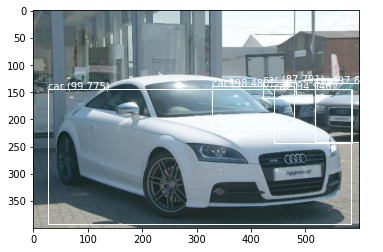

car 99.97838735580444
car 99.95688796043396
car 99.10798668861389
car 94.26706433296204
car 99.0255057811737
car 42.221155762672424
car 55.680012702941895


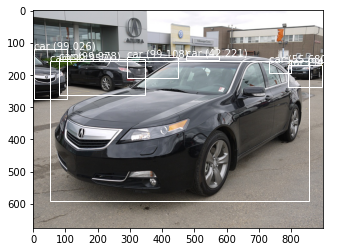

truck 98.74996542930603


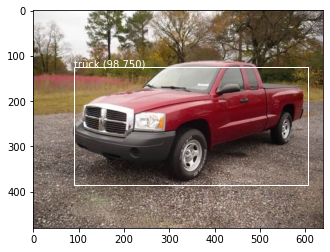

car 97.70952463150024


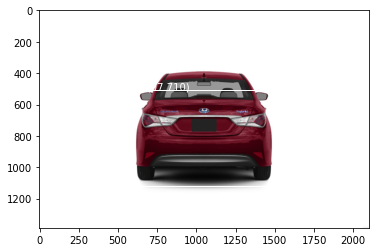

truck 81.01378679275513
car 33.66290032863617


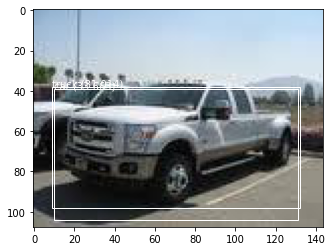

car 99.54158663749695


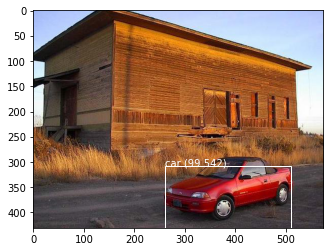

truck 90.91365933418274
car 96.73429131507874
car 49.06923174858093
truck 56.517815589904785
car 57.1202278137207
truck 63.10552358627319
car 35.81242859363556
car 96.38480544090271
car 97.43475914001465


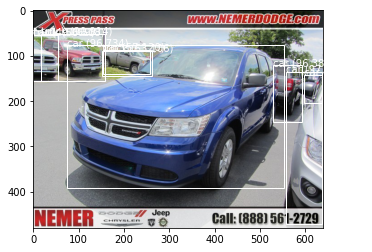

car 57.614463567733765
car 98.14242720603943
car 97.78807759284973


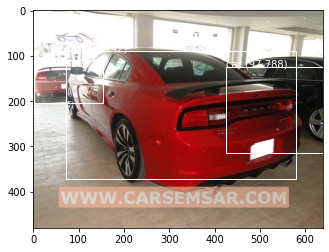

car 99.80280995368958


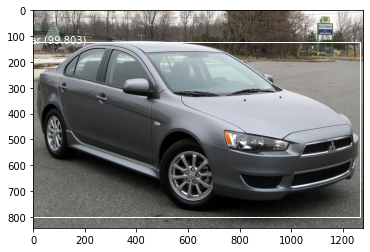

car 95.01668810844421


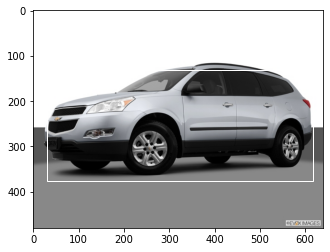

car 99.81825947761536


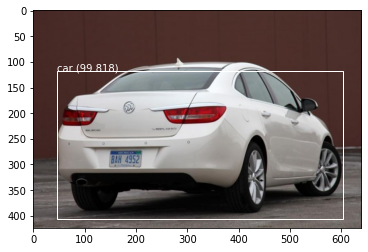

truck 76.28903388977051
car 56.27436637878418


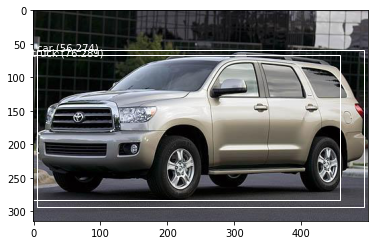

car 98.87044429779053
person 88.62197399139404
car 68.61162185668945
car 68.94463300704956
person 92.37316250801086
person 78.64962220191956
person 32.829368114471436
person 34.68998968601227
person 99.68681931495667
person 48.69990944862366
person 38.01364004611969
person 65.0206208229065
person 79.13230657577515
person 37.66205906867981


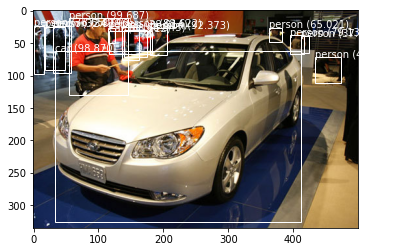

car 93.75307559967041


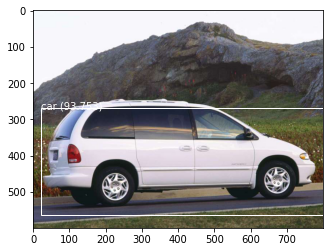

car 97.39372730255127
person 86.97469234466553
person 99.9110758304596


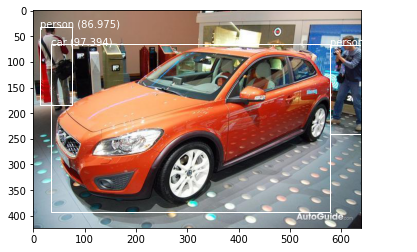

car 96.89639806747437
car 82.16044306755066
car 82.91743397712708
car 98.37483763694763
car 99.4375228881836


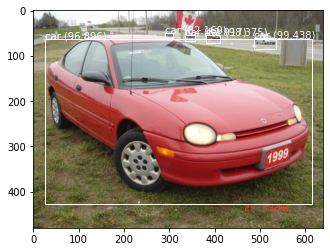

car 99.59941506385803
person 84.38175320625305
person 33.32521915435791
person 47.12548851966858
person 85.5709433555603
person 90.97289443016052
person 49.2407351732254


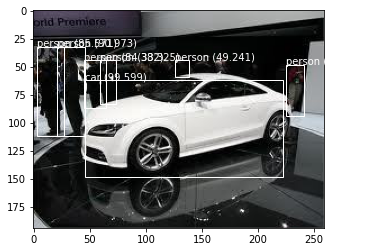

car 99.00417923927307


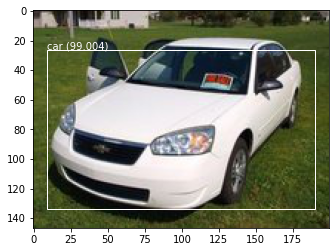

car 96.9569742679596


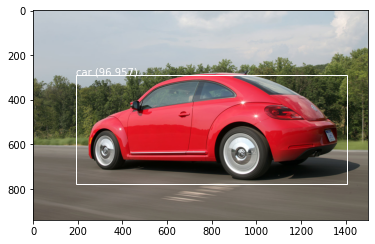

train 74.0511417388916
car 96.9769537448883


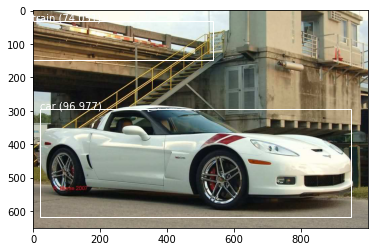

car 99.87565875053406
person 55.48224449157715
person 92.16605424880981
person 98.67683053016663
person 55.78374266624451
person 98.37250709533691
person 68.18565130233765
person 91.17180705070496
person 67.46963262557983
person 33.34900736808777
person 36.43064498901367


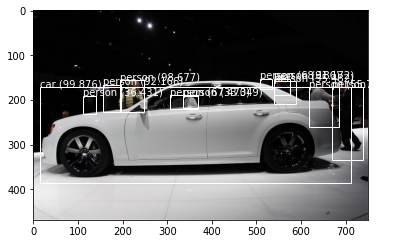

car 99.42813515663147


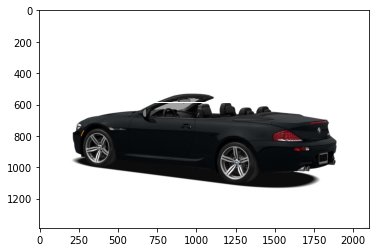

truck 90.76829552650452


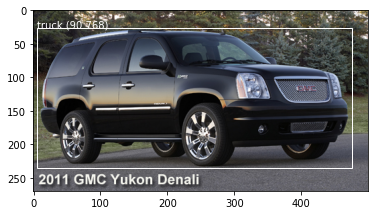

truck 35.89860796928406
car 84.65186357498169


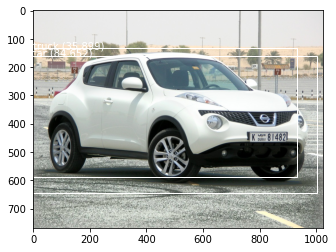

truck 68.01733374595642
car 72.21800088882446


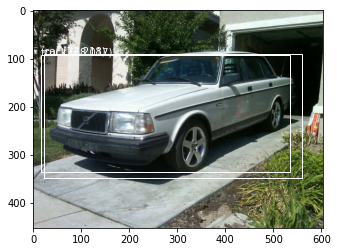

In [37]:
for i in range(25):
    image_name = df_train.iloc[i][8]
    
    # load picture with old dimensions
    image, image_w, image_h = load_image_pixels(image_name, (WIDTH, HEIGHT))
    
    # Predict image
    yhat = model.predict(image)
    
    # Create boxes
    boxes = list()
    for i in range(len(yhat)):
        # decode the output of the network
        boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, HEIGHT, WIDTH)

    # correct the sizes of the bounding boxes for the shape of the image
    correct_yolo_boxes(boxes, image_h, image_w, HEIGHT, WIDTH)

    # suppress non-maximal boxes
    do_nms(boxes, 0.5)

    # define the labels (Filtered only the ones relevant for this task, which were used in pretraining the YOLOv3 model)
    labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck","boat"]

    # get the details of the detected objects
    v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)

    # summarize what we found
    for j in range(len(v_boxes)):

        print(v_labels[j], v_scores[j])

    # draw what we found
    draw_boxes(image_name, v_boxes, v_labels, v_scores)